# Unsupervised Learning: K-Means Clustering

### Imports

In [2]:
pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


In [3]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import cluster, datasets, metrics
from sklearn.datasets import make_blobs
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

### What is clustering?

- Most of the data out there is unlabeled.  
- Getting labeled training data is often difficult, expensive, or simply impossible in some cases.
- Can we extract some useful information from unlabeled data?
- The most intuitive way is to group similar examples together to get some insight into the data even though we do not have the targets.  


**Clustering** is the task of partitioning the dataset into groups called clusters based on their similarities.

The goal of clustering is to discover underlying groups in a given dataset such that:
- examples in the same group are as similar as possible;
- examples in different groups are as different as possible.   

### Clustering: Input and possible output

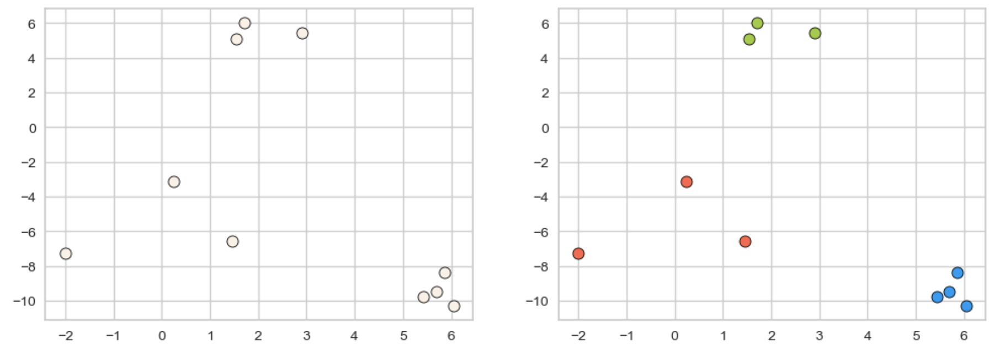

One way to think of clustering is the task of colouring the given set of points (e.g., blue, red, green) such that points with the same color are close to each other.

- Usually the clusters are identified by a **cluster label**.
- These labels are arbitrary, and relabeling the points (label switching) does not make a difference.
- What we care about is which points have the same labels and which ones have different labels.
- Very often we do not know how many clusters are there in the data or if there are any clusters at all. In real-world data, clusters are rarely as clear as in our toy example above.
- There is a notion of coherent and semantically meaningful clusters in some sense but there is no absolute truth here.

#### Example 1: What is "correct" grouping?
Which of the following grouping of emoticons is the "correct" grouping?

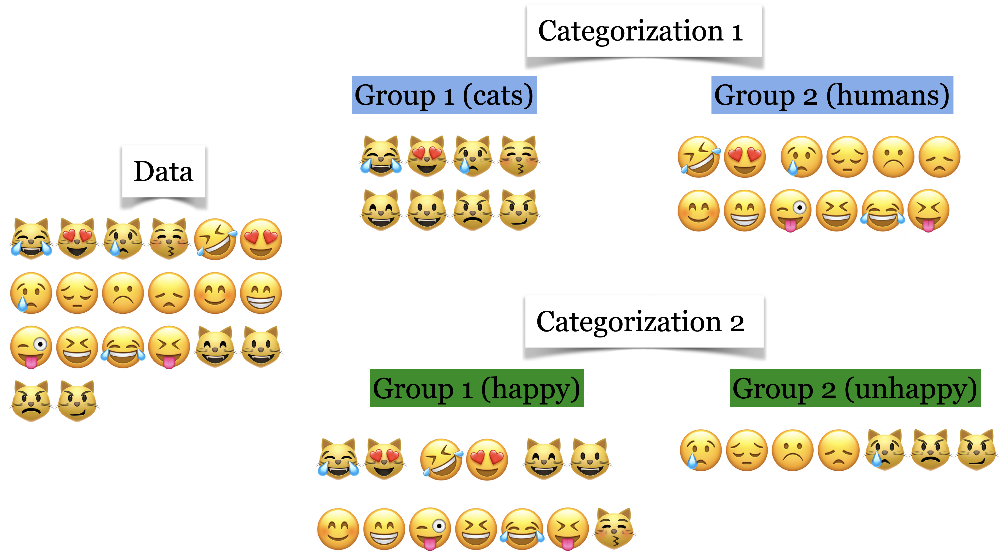

Both seem reasonable!

- In clustering, meaningful groups are dependent on the **application**.
- It usually helps if we have some prior knowledge about the data and the problem.   
- This makes it hard for us to objectively measure the quality of a clustering algorithm (or think about "true" clusters).

### Common Applications

#### Data exploration
Although there is no notion of the "right" answer, we might still get something useful out of clustering. There are a number of common applications for clustering.

- Summarize or compress data.
- Partition the data into groups before further processing.
- For instance, you could use it in supervised learning setting as follows. Carry out clustering and examine performance of your model on individual clusters. If the performance is lower on a particular cluster, you could either try building a separate model for that cluster and improve the overall performance of your supervised model.

#### Customer segmentation

- Understand landscape of the market in businesses and craft targeted business or marketing strategies tailored for each group.

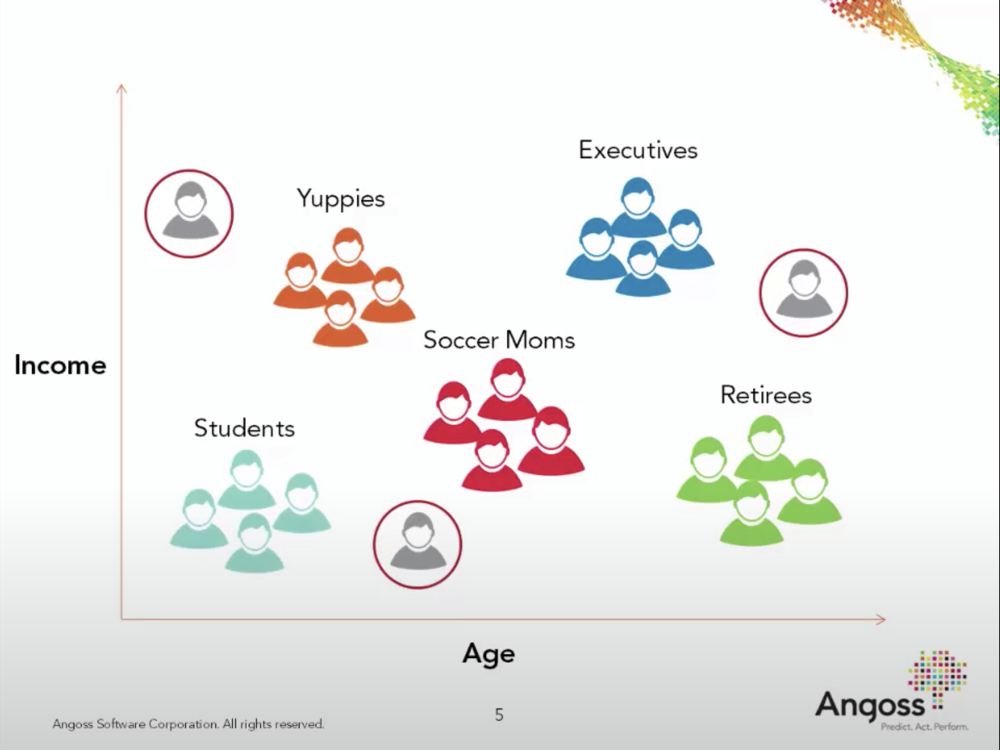

#### Document clustering

Grouping articles on different topics from different news sources. For example, [Google News](https://news.google.com).

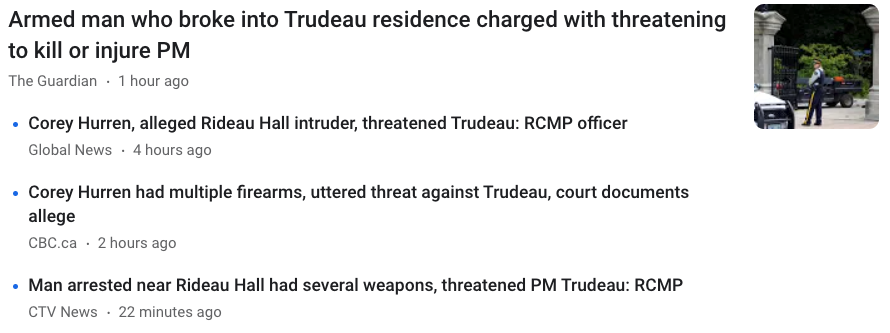

### Other applications
- Social network analysis
- Medical imaging (image segmentation, image grouping, anomaly detection)
- Imputing missing data, data compression, privacy preservation

## K-Means Clustering

- Clustering is based on the notion of similarity or distances between points.
- How do we determine similarity between points in a multi-dimensional space?
- Can we use something like $k$-neighbours for similarity?
    - Yes! That's a good start!  
    - With $k$-neighbours we used Euclidean distances to find nearby points.
    - We can use the same idea for clustering!

K-Means is one of the most commonly used clustering algorithms.

**Input**
- `X` $\rightarrow$ a set of data points  
- `K` (or $k$ or `n_clusters`) $\rightarrow$ number of clusters

**Output**
- `K` clusters (groups) of the data points

### How does K-Means work?

- Represent each cluster by its cluster center and assign a cluster membership to each data point.

**Chicken-and-egg problem!**

- If we knew cluster centers, we can simply assign each point to its nearest center.
- Similarly, if we knew assignments, we can calculate cluster centers.  
- But we do not know either 😟.

A usual computer science answer to such problems is iterations!! So here is what we do

- Pick number of clusters $k$.
- Pick $k$ random points as “cluster center”
- While cluster centers change:
    1. Assign each data point to it’s closest cluster center
    2. Recompute cluster centers as the mean of the assigned points. ] ]

The algorithm proceeds like this:
- you pick the number of clusters $k$,
- then you randomly pick $k$ data points from the data, and declare those as cluster centers.
- Then, you label each data point according to which cluster center it is closest to.
- Finally, you recompute the cluster centers as the means of the clusters, and you iterate.

The algorithm always converges, which is when the **assignment of the points to the clusters doesn’t change any more**. Often you might want to not wait until full convergence, but just stop if the **cluster centers don’t move much between iterations**.


Here's a visual summary of the steps:

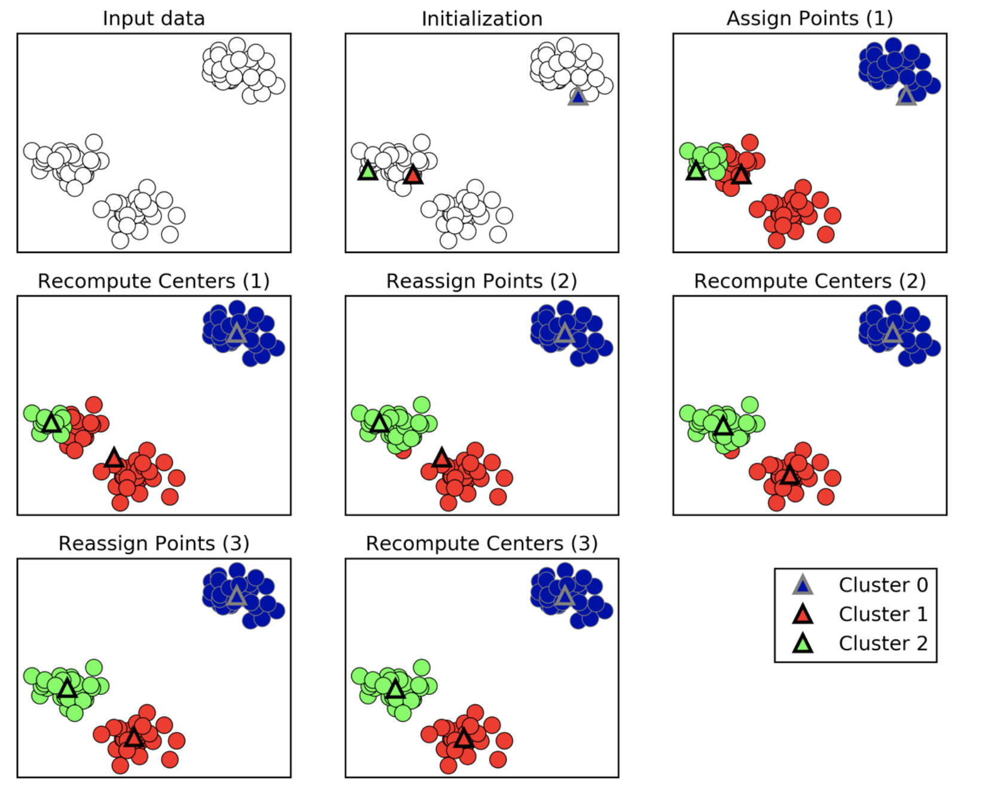

### K-Means using `sklearn`


Let's start with some data points:

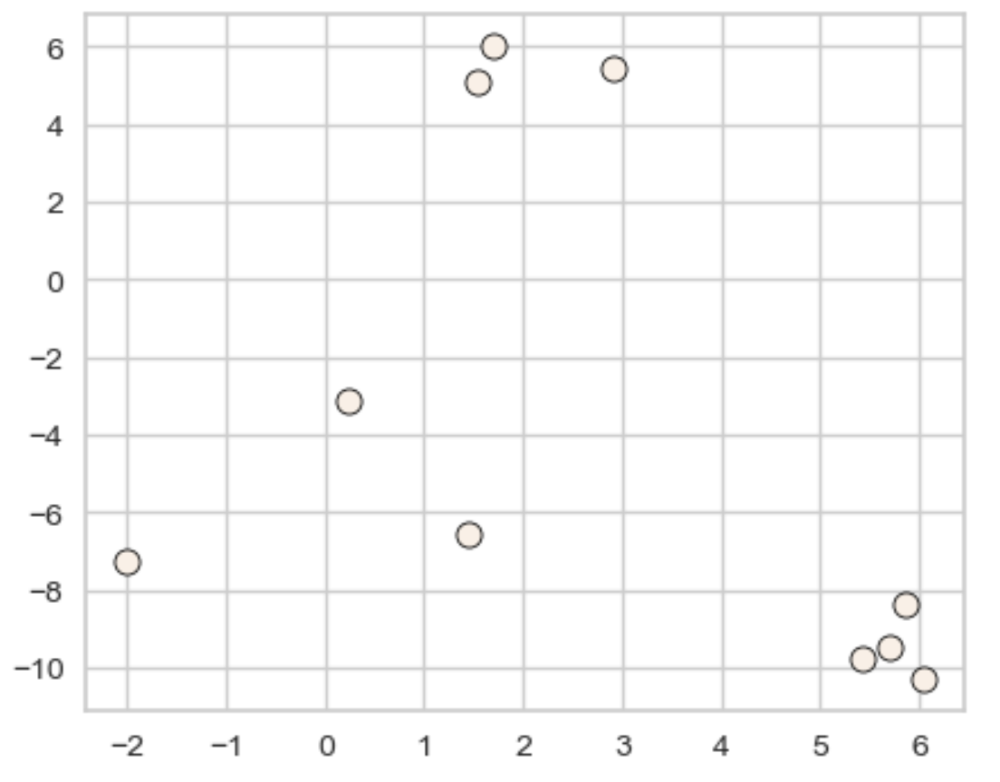

K-means will assign each data point to a cluster as follows:

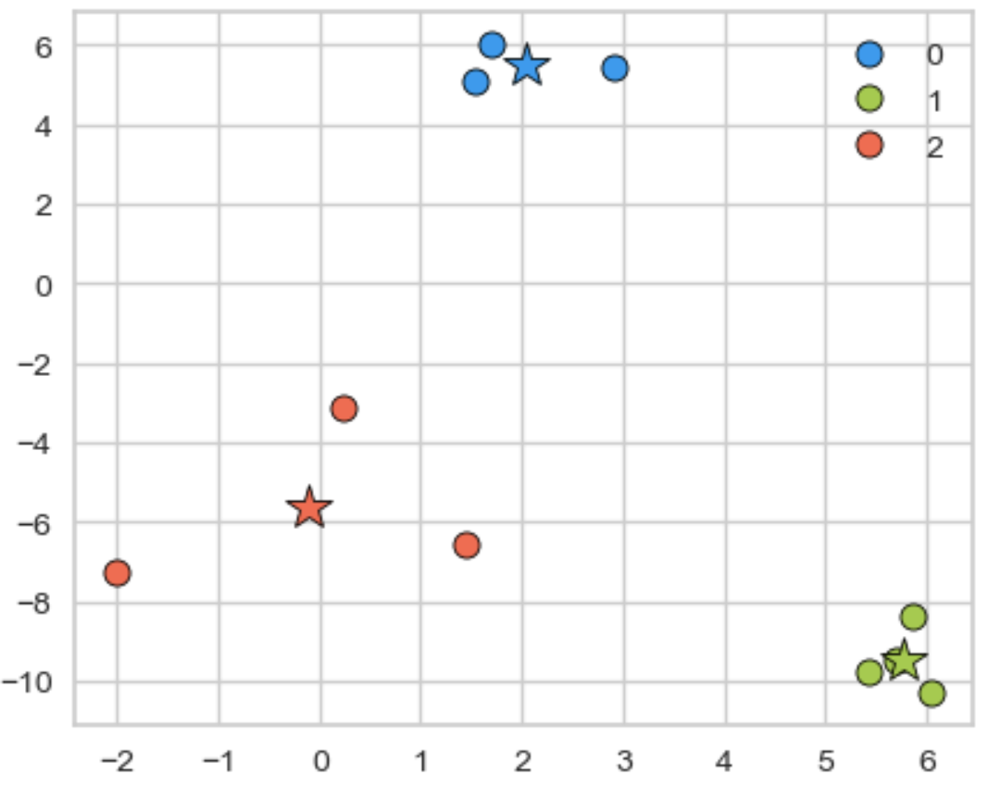

Cluster centers are shown with stars. They are the average of observations in a cluster and so not usually one of the data points. These centers are also referred to as **centroids**.

Now let's suppose we have some new examples to predict on!

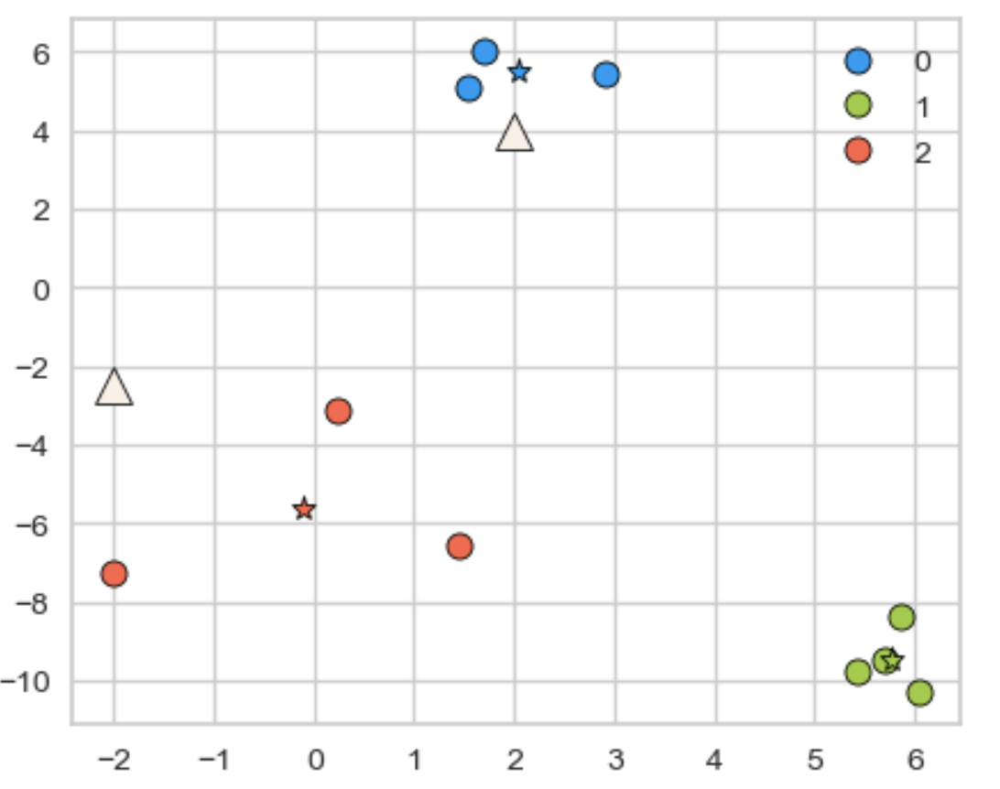

K-Means can be use to predict the cluster labels for these new examples. The prediction will look something like this

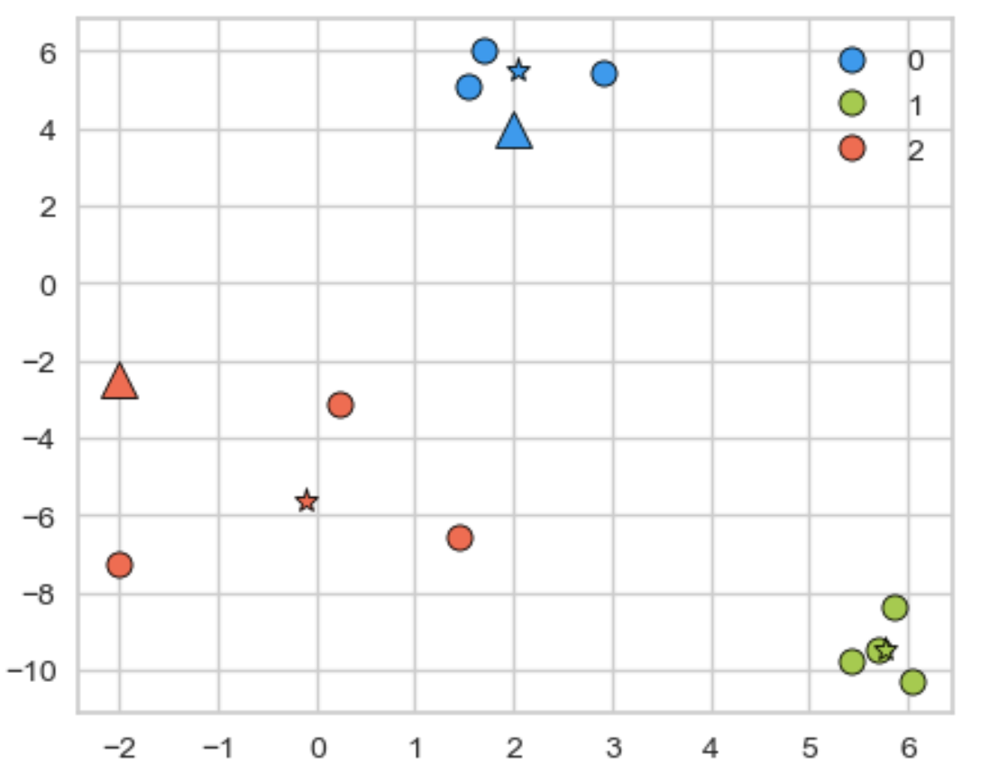

Now let's do this with `sklearn`. We fist generate some data

In [4]:
X, y = make_blobs(n_samples=10, centers=3, n_features=2, random_state=10)

We can then fit the `KMeans` object by setting the number of clusters to 3:

In [5]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, n_init='auto')
kmeans.fit(X); # We are only passing X because this is unsupervised learning

- The output of `KMeans` is `n_clusters` clusters (groups) of the data points.
- Calling `predict` on the `KMeans` object gives us the cluster assignment for each data point.

In [6]:
clust_labels = kmeans.predict(X)
clust_labels

array([0, 1, 2, 1, 0, 0, 2, 2, 1, 0], dtype=int32)

We can also access these labels with the `labels_` attribute of `KMeans` object.

In [7]:
kmeans.labels_

array([0, 1, 2, 1, 0, 0, 2, 2, 1, 0], dtype=int32)

In [8]:
toy_clust_df = pd.DataFrame(X, columns = ['feat1', 'feat2'])
toy_clust_df['cluster labels'] = clust_labels
toy_clust_df

,feat1,feat2,cluster labels
0,5.691924,-9.476412,0
1,1.707899,6.004352,1
2,0.236210,-3.119100,2
3,2.901595,5.421215,1
4,5.859439,-8.381924,0
5,6.047749,-10.305047,0
6,-2.007588,-7.247439,2
7,1.454677,-6.583872,2
8,1.536362,5.111215,1
9,5.430704,-9.759561,0


In K-Means each cluster is represented by its **cluster center**. Let's examine these cluster centers from the `kmeans` object above.

In [9]:
cluster_centers = kmeans.cluster_centers_
cluster_centers

array([[ 5.75745416, -9.48073598],
       [ 2.04861878,  5.51226051],
       [-0.10556679, -5.65013704]])

With a fitted K-Means object, we can also use `predict` on unseen examples!  

Consider the two new query points:


In [10]:
new_examples = np.array([[-2, -2.5], [2, 4]])
kmeans.predict(new_examples)

array([2, 1], dtype=int32)

### A comment on initialization

- K-Means uses Euclidean distances to find closest centers
- The initialization of K-Means is stochastic, can this affect the results?
    - Yes! Big time.  
- Let's look at an example.

#### Example: Bad initialization

The following initialization results in a bad cluster assignment!

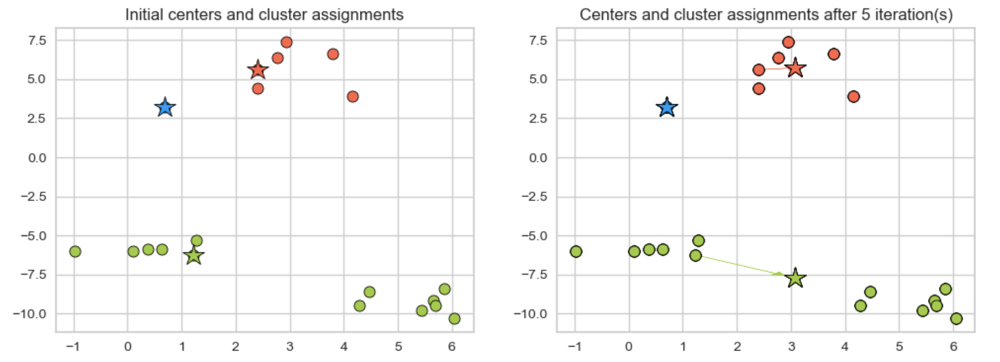

#### Example: Better initilaization

This seems to be doing a better job!

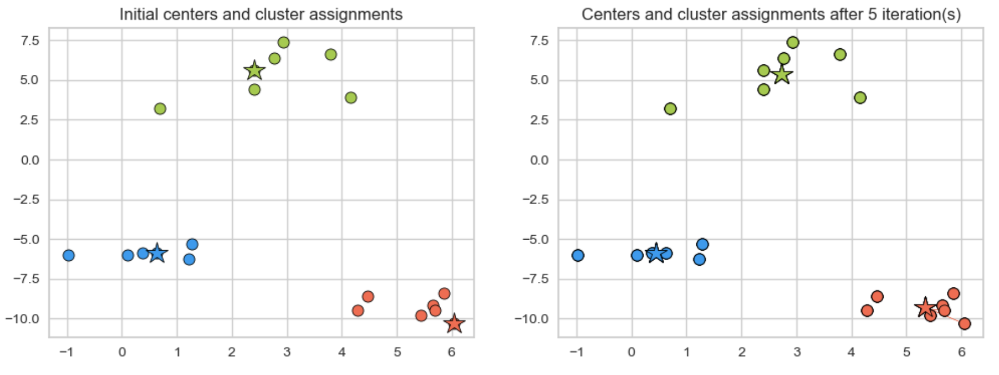

#### What can we do about it?

- One strategy is to run the algorithm several times.
    - Check out `n_init` parameter of [`sklearn`'s `KMeans`](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).
- Is it possible to pick `K` in a smart way?
    - Yes! We can use the so-called [K-Means++](http://ilpubs.stanford.edu:8090/778/1/2006-13.pdf).
    - Intuitively, it picks the initial centroids which are far away from each other.
    - In other words, K-Means++ gives more chance to select points that are far away from centroids already picked.    
    - By default `sklearn` uses this strategy for initialization.

### Objective function for K-Means

- Find the local minimum of minimizing squared distances (L2 norm).  
- The algorithm optimizes the sum of the distances of the cluster centers to all the points in that cluster. In other words, it minimizes within-cluster sum-of-squares criterion.

$$\sum_{i=1}^k\sum_{j=1}^n u_{ij}\lVert{\mathbf{x}_j-\mathbf{c}_i}\rVert^2_2$$

- $u_{ij}$ is 1 if the point $\mathbf{x}_j$ belongs to cluster $i$, and 0 otherwise
- $\mathbf{c}_i$ is the centroid of the $i^{th}$ cluster

- It's an NP hard problem and we cannot hope to solve it exactly but the K-Means algorithm we saw provides us a local minimum.  

The algorithm above is called **Lloyd's algorithm**.

### Distances in K-Means

- We are using the L2 norm here to calculate distances. $$\lVert{\mathbf{x}_j-\mathbf{c}_i}\rVert^2_2$$
- We can use a different distance metrics; but then,
    - it won't be K-Means anymore, as the very idea of mean is based on Euclidean distance.
    - there is no guarantee that the centroid will minimize the distance being used (it most probably will not!).

### Feature engineering using K-Means

- K-Means could be used for feature engineering in supervised learning.
- Examples:
    - You could add a categorical feature: cluster membership
    - You could add a continuous features: distance from each cluster center
- See [this paper](http://ai.stanford.edu/~acoates/papers/coatesleeng_aistats_2011.pdf).

### Time complexity of K-Means

- Naive implementation of K-Means requires you to compute the distances from all data points to all cluster centers.
- So there are many distance calculations per iteration.
- calculating assigning observations to centers is heavy: $\mathcal{O(ndk)}$
- updating centers is light(er): $\mathcal{O(nd)}$

where,

- $n \rightarrow$ number of examples
- $d \rightarrow$ number of features
- $k \rightarrow$ number of clusters

### Hyperparameter tuning for the number of clusters

- When running K-Means we need to decide the number of clusters in advance (`n_clusters` in `sklearn`). How do we pick this hyperparameter?
- In supervised setting we carried out hyperparameter optimization based on cross-validation scores.
- Since in unsupervised learning we do not have the target values, it becomes difficult to objectively measure the effectiveness of the algorithms.
- There is no definitive or satisfactory approach.
- However, some strategies might be useful to help you determine k.

#### Method 1: The Elbow method

- This method looks at the sum of **intra-cluster distances**, which is also referred to as **inertia**.
- The intra-cluster distance in our toy example above is given as   

$$\sum_{P_i \in C_1}  distance(P_i, C_1)^2 + \sum_{P_i \in C_2}  distance(P_i, C_2)^2 + \sum_{P_i \in C_3} distance(P_i, C_3)^2$$

Where
- $C_1, C_2, C_3$ are centroids
- $P_i$s are points within that cluster
- $distance$ is the usual Euclidean distance.

#### Inertia

You can access this intra-cluster distance or inertia as follows.

In [11]:
XX, y = make_blobs(centers=3, n_features=2, random_state=10)
d = {"k": [], "inertia": []}
for k in range(1, 100, 10):
    model = KMeans(n_clusters=k, n_init='auto').fit(XX)
    d["k"].append(k)
    d["inertia"].append(model.inertia_)
pd.DataFrame(d)

,k,inertia
0,1,4372.460950
1,11,65.674425
2,21,26.604061
3,31,13.962470
4,41,7.598960
5,51,3.898314
6,61,2.047456
7,71,1.144411
8,81,0.341205
9,91,0.053156


- The inertia decreases as k increases.
- Question: Do we want inertia to be small or large?
- The problem is that we can't just look for a $k$ that minimizes inertia because it decreases as $k$ increases.
    - If I have number of clusters = number of examples, each example will have its own cluster and the intra-cluster distance will be 0.  
- Instead we evaluate the trade-off: "small k" vs "small intra-cluster distances".

In [12]:
def plot_elbow(w, h, inertia_values):
    plt.figure(figsize=(w, h))
    plt.axvline(x=3, linestyle="-.", c="black")
    plt.plot(range(1, 10), inertia_values, "-o")
    ax = plt.gca()
    ax.tick_params("both", labelsize=(w + h))
    ax.set_xlabel("K", fontsize=w+h)
    ax.set_ylabel("Inertia", fontsize=w+h)

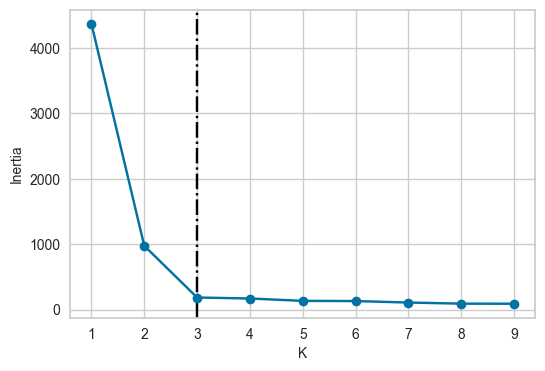

In [13]:
inertia_values = list()
for k in range(1, 10):
    inertia_values.append(KMeans(n_clusters=k, n_init='auto').fit(XX).inertia_)
plot_elbow(6, 4, inertia_values)

- From the above plot, we could argue that three clusters (the point of inflection on the curve) are enough.
- The inertia decreases when clusters are greater than 3. However it's not a big improvement and so we prefer k=3.
- In this toy example, it's the plot is kind of clear and easy to interpret but it can be hard to interpret in real life examples.

There is a package called [`yellowbrick`](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html) which can be used to create these plots conveniently.

In [17]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(n_init='auto')
visualizer = KElbowVisualizer(model, k=(1, 10))

visualizer.fit(XX)  # Fit the data to the visualizer
visualizer.show()

YellowbrickTypeError: The supplied model is not a clustering estimator; try a classifier or regression score visualizer instead!

In [18]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# 1. Initialize the model explicitly
model = KMeans(n_init=10) # Using an integer instead of 'auto' can sometimes help older versions

# 2. Pass the model directly into the visualizer
visualizer = KElbowVisualizer(model, k=(2, 10))

# 3. Fit and show
visualizer.fit(XX) 
visualizer.show()

YellowbrickTypeError: The supplied model is not a clustering estimator; try a classifier or regression score visualizer instead!

#### Method 2: The Silhouette method

- Not dependent on the notion of cluster centers.
- Calculated using the **mean intra-cluster distance** ($a$) and the **mean nearest-cluster distance** ($b$) for each sample.

#### Mean intra-cluster distance ($a$)

- Suppose the green point below is our sample.
- Average of the distances of the green point to the other points in the same cluster.
  - These distances are represented by the black lines.

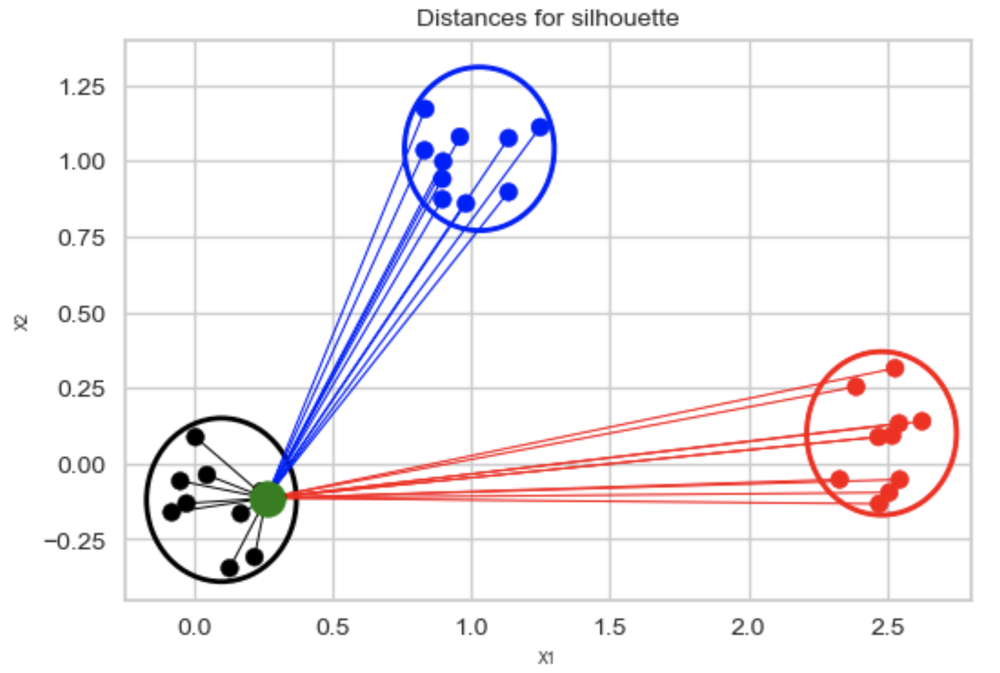

#### Mean nearest-cluster distance ($b$)

- Average of the distances of the green point to the blue points is smaller than the average of the distances of the green point to the red points. So the **nearest cluster** is the blue cluster.
- So the mean nearest-cluster distance is the average of the distances of the green point to the blue points.  

#### Silhouette distance for a sample

- the difference between the **the average nearest-cluster distance** ($b$) and **average intra-cluster distance** ($a$) for each sample, normalized by the maximum value

$$\frac{b-a}{max(a,b)}$$

- The best value is 1.
- The worst value is -1 (samples have been assigned to wrong clusters).
- Value near 0 means overlapping clusters.

The overall **Silhouette score** is the average of the Silhouette scores for all samples. We can visualize the silhouette score for each example individually in a silhouette plot (hence the name), see below.

#### Using Silhouette scores to select the number of clusters

- The plots below show the Silhouette scores for each sample in that cluster.
- Higher values indicate well-separated clusters.
- The size of the Silhouette shows the number of samples and hence shows imbalance of data points in clusters.  

In [19]:
from yellowbrick.cluster import SilhouetteVisualizer

model = KMeans(2, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(model, colors="yellowbrick")
visualizer.fit(XX)  # Fit the data to the visualizer
visualizer.show();
# Finalize and render the figure

YellowbrickTypeError: The supplied model is not a clustering estimator; try a classifier or regression score visualizer instead!

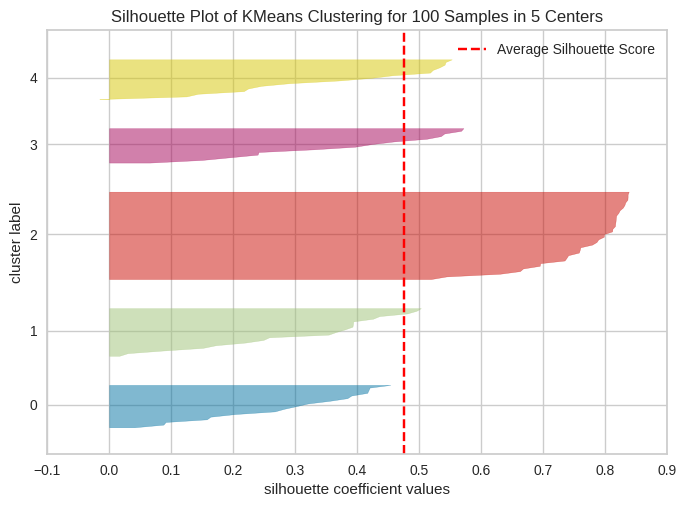

In [ ]:
model = KMeans(5, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(model, colors="yellowbrick")
visualizer.fit(XX)  # Fit the data to the visualizer
visualizer.show();
# Finalize and render the figure

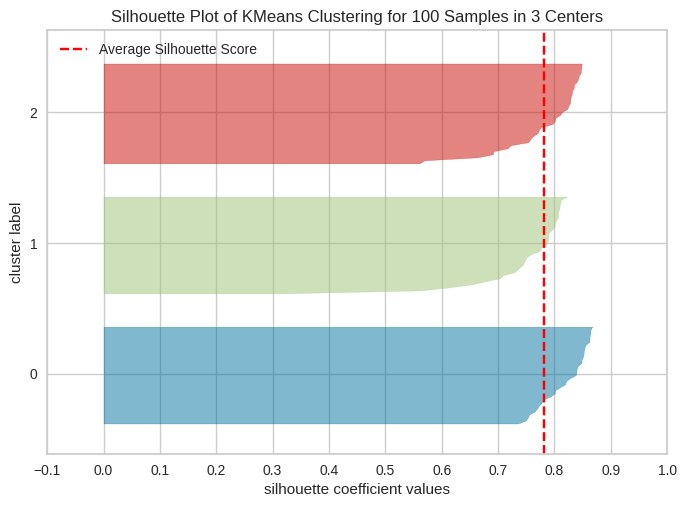

In [ ]:
model = KMeans(3, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(model, colors="yellowbrick")
visualizer.fit(XX)  # Fit the data to the visualizer
visualizer.show();
# Finalize and render the figure

#### What to look for in these plots?

- Unlike inertia, larger values are better because they indicate that the point is further away from neighbouring clusters.
- The thickness of each silhouette indicates the cluster size.
- The shape of each silhouette indicates the "goodness" for points in each cluster.
- The length (or area) of each silhouette indicates the goodness of each cluster.
- A slower dropoff (more rectangular) indicates more points are "happy" in their cluster.
- We can apply Silhouette method to clustering methods other than K-Means.

### Important points to remember

- Clustering is a common unsupervised approach to identify underlying structure in data and grouping points based on similarity.
- Appropriate data representation is crucial for meaningful clustering.
- We did not talk much about distance metrics but that is another importance consideration in clustering.
- K-Means is a popular clustering algorithm.

**Clustering with K-Means**
- It requires us to specify the number of clusters in advance.
- Each example is assigned to one (and only one) cluster.
- The labels provided by the algorithm have no actual meaning.
- The centroids live in the same space as of the dataset but they are **not** actual data points, but instead are average points.
- It always converges. Convergence is dependent upon the initial centers and it may converge to a sub-optimal solution.
- Two popular ways to provide insight into how many clusters are reasonable for the give problem are: **the Elbow method** and **the Silhouette method**.  

### Something to practice:

Use K-means clustering to cluster the [penguins](https://www.kaggle.com/datasets/youssefaboelwafa/clustering-penguins-species) data. Evaluate your clusters using elbow and Silhouette methods.

# Gaussian Mixture Models

## Imports

In [20]:
import numpy as np
import pandas as pda
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import cluster, datasets, metrics
from sklearn.datasets import make_blobs, make_circles, make_moons
from scipy.stats import multivariate_normal, norm

## Introduction to Gaussian mixture models

- K-Means is great but it cannot handle oddly shaped clusters.
- In K-Means our clusters are solely defined by cluster centers.
- Let's look at some examples.

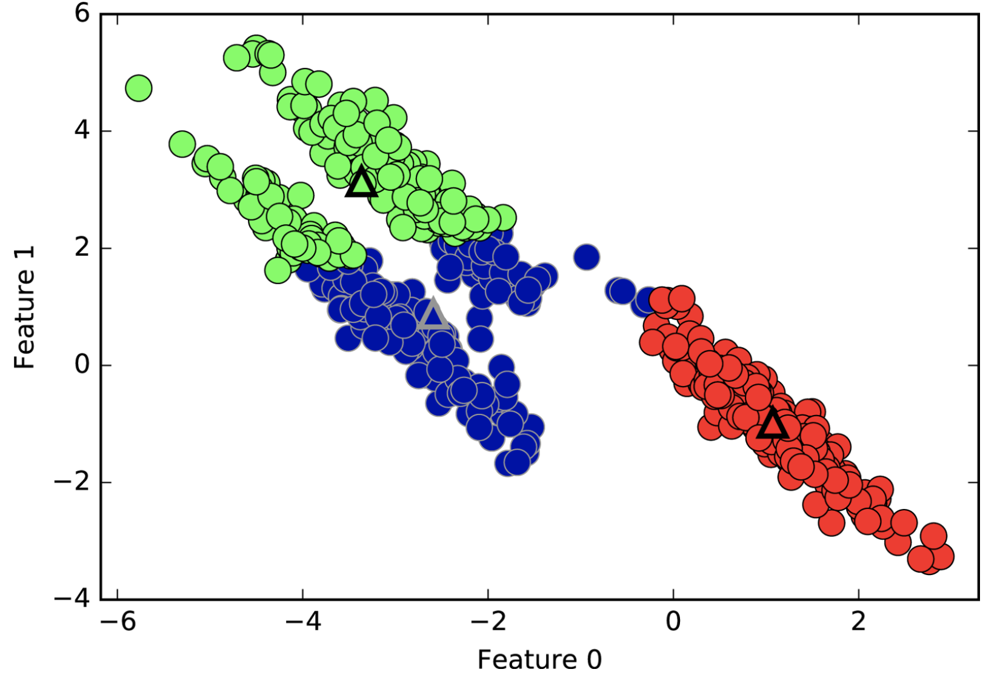

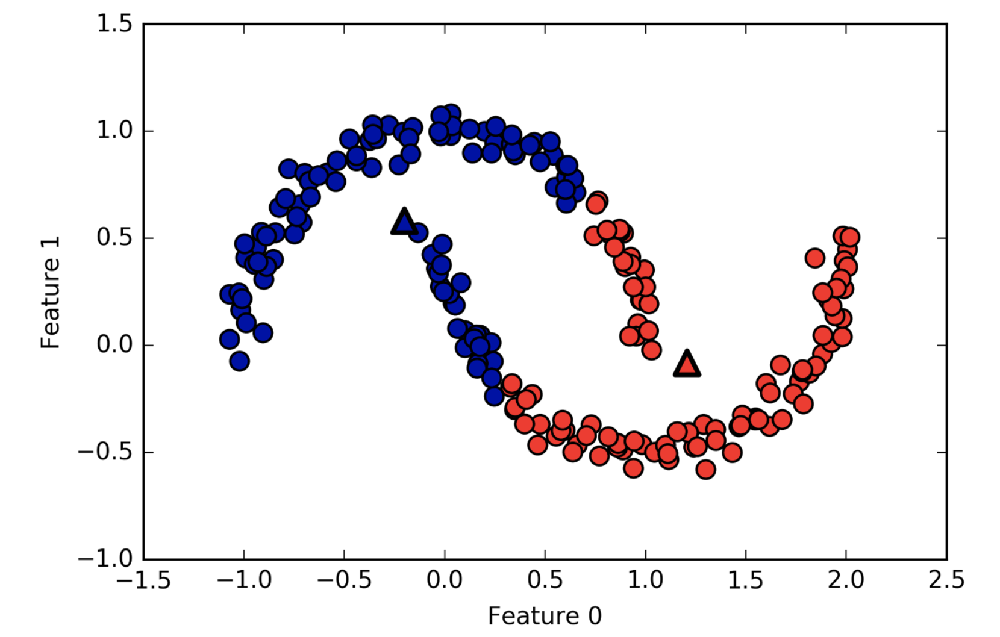

- One limitation of K-Means is that it only takes into account means of data points and not the spread of the data points.
- How about taking into account the covariance matrices, i.e., how spread out the data is?
- Is it possible to generalize K-Means clustering to incorporate information about the covariance structure of the data as well as the centers?
- One idea is to model the data as a weighted sum of Gaussian distributions, where each Gausssian, referred to as a **component** of the mixture, has its own mean vector and covariance matrix and a corresponding weight. These models are referred to as **mixture of Gaussians** or **Gaussian mixture models**.
- There is a lot to say about these models. In the interest of time, we'll keep things high level in this course.
- First, let's try it out with sklearn.

In [21]:
dataset_sub1 = multivariate_normal.rvs(
    mean=[2, 4], cov=[[12, 11.5], [11.5, 12]], size=200, random_state=42
)

dataset_sub2 = multivariate_normal.rvs(
    mean=[11, -3], cov=[[12, -10], [-10, 12]], size=100, random_state=42
)

dataset_sub3,y = make_blobs(random_state=42, centers =1, cluster_std=1.8, n_samples=50)
dataset_sub4 = dataset_sub3 + np.array([4, -14])

X_train = np.vstack([dataset_sub1, dataset_sub2, dataset_sub4])
# X_train = np.vstack([dataset_sub1, dataset_sub2])

X_train.shape

(350, 2)

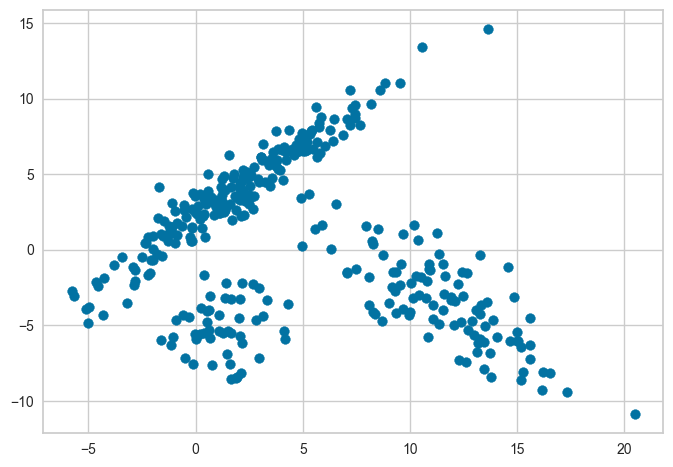

In [22]:
plt.scatter(X_train[:, 0], X_train[:, 1]);

In [23]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=3, n_init="auto")
km.fit(X_train)
km_labels = km.labels_

In [24]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3, covariance_type="full") # more on covariance_type in a bit
gmm.fit(X_train)
gmm_labels = gmm.predict(X_train)

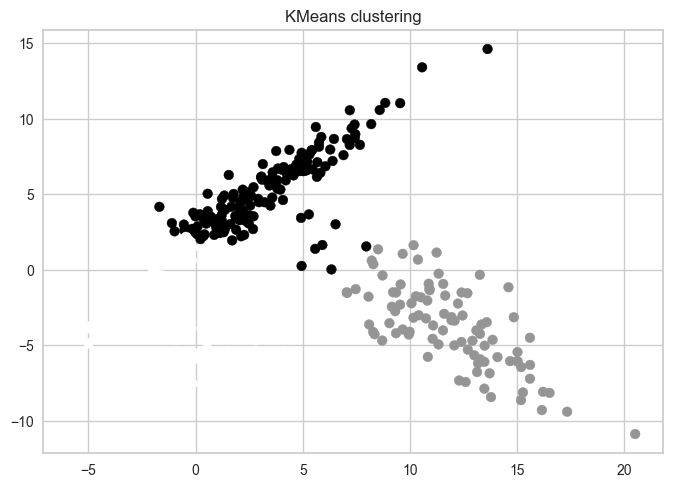

In [25]:
plt.scatter(X_train[:, 0], X_train[:, 1], c=km_labels);
plt.title('KMeans clustering');

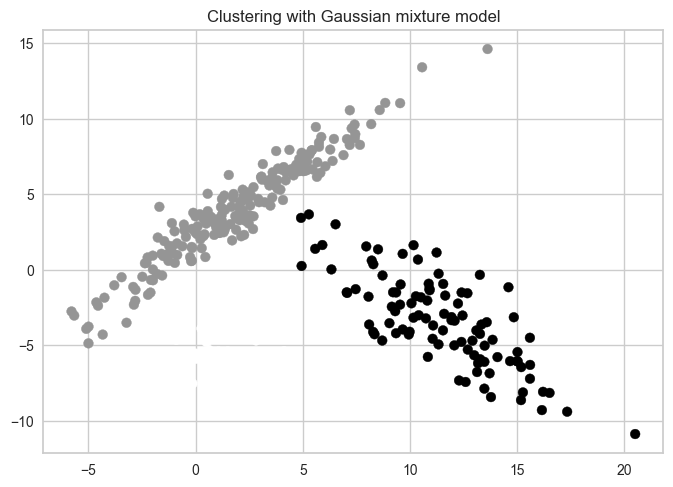

In [26]:
plt.scatter(X_train[:, 0], X_train[:, 1], c=gmm_labels);
plt.title('Clustering with Gaussian mixture model');

On this toy dataset, clustering with GMM seems better; It is able to capture elipse-shaped clusters.

Now the model is means and covariances.

In [27]:
gmm.means_

array([[ 1.2562018 , -5.15024371],
       [ 1.93602951,  3.96302316],
       [11.38140294, -3.31733782]])

Since our dataset is 2d, we get a 2d vector for the mean of each cluster.  

In [28]:
gmm.covariances_

array([[[ 1.97711729,  0.26678788],
        [ 0.26678788,  3.11152053]],

       [[10.95691356, 10.63492096],
        [10.63492096, 11.26119679]],

       [[ 9.09426812, -7.25872814],
        [-7.25872814,  9.39387357]]])

Since our dataset is 2d, we get a 2 by 2 co-variance matrix for each cluster.

> - There is a non-negative weight associated with each component which represents the proportion of total distribution contributed by that component.  

In [29]:
gmm.weights_

array([0.14041602, 0.57276334, 0.28682064])

We have trained our model with three components so we have three weights (prior probabilities) associated with each component. The sum of the weights is 1.0.

In [30]:
np.sum(gmm.weights_)

np.float64(1.0)

#### How does it work? (high-level)

- Given $k$, the number of clusters or the number of components, we want to fit Gaussian blobs to the data. Each Gaussian will have it's own mean vector and covariance matrix.
- This is a **generative model**; it models the probability of a given data point being generated from the mixture of the Gaussians.  

$$P(x) = \sum_{j=1}^{k} \pi_k \mathcal{N}(x, \mu_k, \Sigma_k)$$

- $x \rightarrow$ a data point
- $\pi_k \rightarrow$ the weight of component $k$ (between 0 to 1)
- $k \rightarrow$ the number of clusters or the number of components
- $\mu_k \rightarrow$ the mean vector of component $k$
- $\Sigma_k \rightarrow$ the covariance matrix associated with component $k$

The generative story of the model assumes that each data point in the dataset is generated from one of the Gaussian components. So for each example $x$:
- Choose component $k$ with probabilities proportional to the weight $\pi_k$ (prior probability) of the components.
- Choose example $x$ from the Gaussian distribution associated with the $k^{th}$ component: $\mathcal{N}(x, \mu_k, \Sigma_k)$

How to interpret the weights associated with the Gaussians? Let's look at a toy example with of a mixture of Gaussians, i.e., a weighted sum of Gaussians.

In [31]:
# do not worry about this bit of code
import scipy
from scipy.cluster.hierarchy import (
    average,
    complete,
    dendrogram,
    fcluster,
    single,
    ward,
)

def Gaussian_mixture_1d(ϕ1, ϕ2, fig, μ1=0.0, μ2=5.0, Σ1=1, Σ2=3):
    """
    Plot a Gaussian Mixture with two components.

    Parameters:
    -----------
    μ1: float
       the mean of the first Gaussian
    μ2: float
       the mean of the second Gaussian
    Σ1: float
       the variance of the first Gaussian
    Σ2: float
       the variance of the second Gaussian
    ϕ1: float > 0
       the weight of the first component
    ϕ2: float > 0
       the weight of the second component
    w: int
       The width of the plot
    h: int
       the height of the plot
    """

    # Creating the DataFrame
    data = pd.DataFrame({'x': np.arange(np.min([μ1 - 4*Σ1, μ2 - 4*Σ2]), np.max([μ1 + 4*Σ1, μ2 + 4*Σ2]), 1/1000)})
    data['f1(x|mu1,Sigma1)'] = scipy.stats.norm.pdf(data['x'], μ1, Σ1)
    data['f2(x|mu2,Sigma2)'] = scipy.stats.norm.pdf(data['x'], μ2, Σ2)
    data['mixture'] = ϕ1 * data['f1(x|mu1,Sigma1)'] + ϕ2 * data['f2(x|mu2,Sigma2)']


    ## Plotting
    plt.plot('x', 'mixture', data=data, linewidth=4, label='Mixture')
    plt.plot('x', 'f1(x|mu1,Sigma1)', linestyle='--', linewidth=3, alpha = .50, data=data, color='green', label=f'$f_1(x|\mu_1={μ1},\Sigma_1={Σ1})$')
    plt.plot('x', 'f2(x|mu2,Sigma2)', linestyle='--', linewidth=3, alpha = .50, data=data, color='red', label=f'$f_2(x|\mu_2={μ2},\Sigma_2={Σ2})$')
    plt.legend(fontsize=16)
    plt.title(f'Gaussian Mixture: $\Phi_1$ = {ϕ1} and $\Phi_2$ = {ϕ2}', fontdict={'fontsize':18})
    plt.close()
    return fig

In [32]:
def plot_mixture(x):
    ϕ1 = x
    fig = plt.figure(figsize=(6,4))
    return Gaussian_mixture_1d(ϕ1=ϕ1, ϕ2=1-ϕ1, fig=fig)

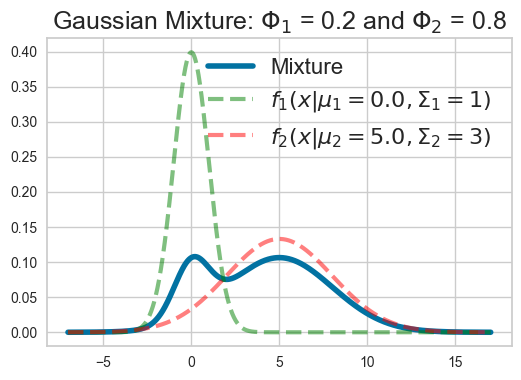

In [33]:
plot_mixture(0.2)

- A mixture of Gaussians can model much more complicated shapes than a single Gaussian distribution.

The goal is to estimate $\pi_k$, $\mu_k$, $\Sigma_k$ for all clusters or components $k$.
- It's a non-convex optimization problem
- It is sensitive to initialization. Usually, it's initialized with K-Means.
- Generally used with "soft" assignments. Each point contributes to the mean and covariance of each component but the points that are far away only contribute a little.  

Under the hood it finds these parameters using an algorithm called **Expectation Maximization**. The idea is to treat the clusters as **hidden variables**.

- Choose starting guesses for the location and shape
- Repeat until converged:
    - E-step: for each point, find weights encoding the probability of membership in each cluster
    - M-step: for each cluster, update its location, normalization, and shape based on all data points, making use of the weights

We can constrain the covariance of the gaussians by using the `covariance_type` option when creating a `GaussianMixture` object. This allows us to control the shape and complexity of clusters.

Let's look at four types supported in `sklearn`:  

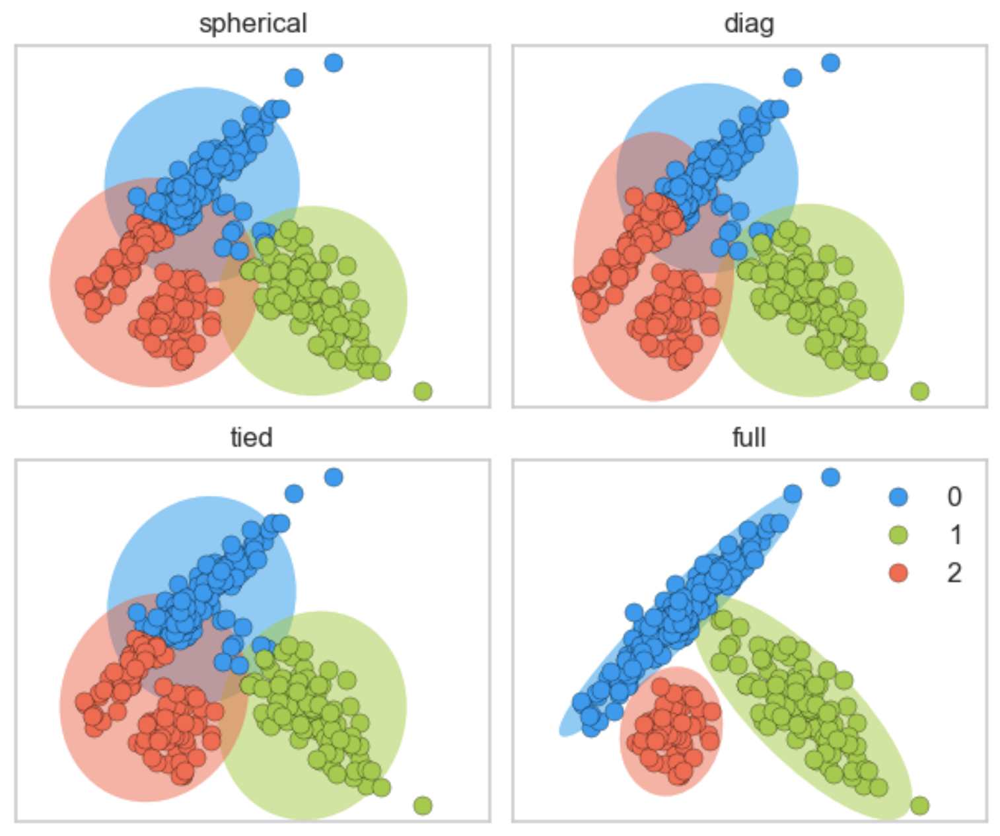

- spherical: each component has its own single variance
- diag: each component has its own diagonal covariance matrix which results in axis-aligned clusters
- tied: all components share the same general covariance matrix which results in Gaussian components with the same shape and orientations  
- full: each component has its own general covariance matrix which results in Gaussian components with different shapes and different orientations

Since GMMs do soft cluster assignment, we can get prediction probabilities. Below are the cluster membership probabilities for a few data points.

In [34]:
k=3
estimator = GaussianMixture(
        n_components=k, covariance_type='full', max_iter=20, random_state=0
    )
estimator.fit(X_train)
pd.DataFrame(estimator.predict_proba(X_train)[10:20]).round(4)

,0,1,2
0,0.9996,0.0000,0.0004
1,0.9899,0.0101,0.0000
2,0.9966,0.0034,0.0000
3,0.9999,0.0001,0.0000
4,0.9961,0.0039,0.0000
5,0.9935,0.0065,0.0000
6,0.9927,0.0073,0.0000
7,0.9981,0.0000,0.0019
8,0.9839,0.0157,0.0003
9,1.0000,0.0000,0.0000


Since GMM is a generative model, we can get the log likelihood of the model generating this data.

In [35]:
estimator.score(X_train)

-5.073780282241252

It's possible to do model selection, i.e., selecting the appropriate covariance type and the number of components based on Akaike Information Criterion (AIC) or Bayesian Information Criterion (BIC) which penalize complex models.

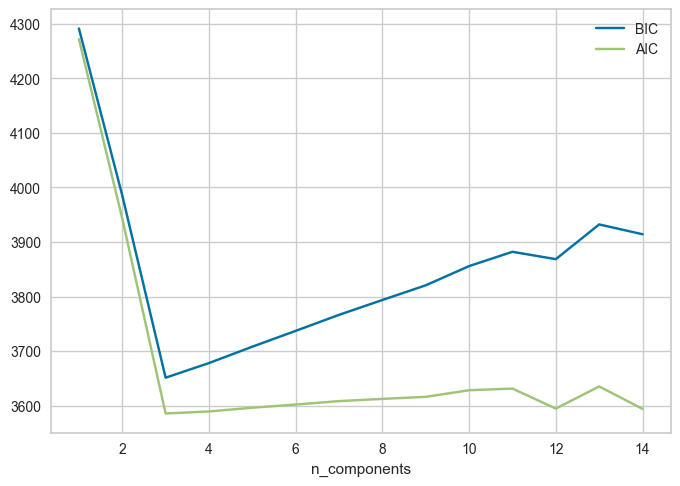

In [36]:
n_components = range(1,15)

gmm_models = [GaussianMixture(n_components=k).fit(X_train) for k in n_components]
aic_scores = [model.aic(X_train) for model in gmm_models]
bic_scores = [model.bic(X_train) for model in gmm_models]

data = np.vstack([n_components, aic_scores, bic_scores]).T
pd.DataFrame(data, columns=['n_components', 'aic', 'bic'])
np.argmin(bic_scores)
plt.plot(n_components, bic_scores, label='BIC')
plt.plot(n_components, aic_scores, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

Here, both AIC and BIC are smallest for `n_components=3`. See an example of using grid search to select the number of components using BIC [here](https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_selection.html#sphx-glr-auto-examples-mixture-plot-gmm-selection-py).

# DBSCAN and Hierarchical Clustering

## Imports

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage
from sklearn import cluster, datasets, metrics
from sklearn.cluster import DBSCAN, AgglomerativeClustering, KMeans
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs, make_moons
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import SilhouetteVisualizer

## DBSCAN

Density based spatial clustering of applications with noise

### DBSCAN introduction

- DBSCAN is a density-based clustering algorithm.
- Intuitively, it's based on the idea that clusters form dense regions in the data and so it works by identifying "crowded" regions in the feature space.
- It can address some of the limitations of K-Means we saw before.
    - It does not require the user to specify the number of clusters in advance.
    - It can identify points that are not part of any clusters.
    - It can capture clusters of complex shapes.

In [38]:
X, y = make_moons(n_samples=200, noise=0.08, random_state=42)
dbscan = DBSCAN(eps=0.2)
dbscan.fit(X)

,"eps eps: float, default=0.5The maximum distance between two samples for one to be consideredas in the neighborhood of the other. This is not a maximum boundon the distances of points within a cluster. This is the mostimportant DBSCAN parameter to choose appropriately for your data setand distance function. Smaller values generally lead to more clusters.",0.2
,"min_samples min_samples: int, default=5The number of samples (or total weight) in a neighborhood for a point tobe considered as a core point. This includes the point itself. If`min_samples` is set to a higher value, DBSCAN will find denser clusters,whereas if it is set to a lower value, the found clusters will be moresparse.",5
,"metric metric: str, or callable, default='euclidean'The metric to use when calculating distance between instances in afeature array. If metric is a string or callable, it must be one ofthe options allowed by :func:`sklearn.metrics.pairwise_distances` forits metric parameter.If metric is ""precomputed"", X is assumed to be a distance matrix andmust be square. X may be a :term:`sparse graph`, in whichcase only ""nonzero"" elements may be considered neighbors for DBSCAN... versionadded:: 0.17 metric *precomputed* to accept precomputed sparse matrix.",'euclidean'
,"metric_params metric_params: dict, default=NoneAdditional keyword arguments for the metric function... versionadded:: 0.19",None
,"algorithm algorithm: {'auto', 'ball_tree', 'kd_tree', 'brute'}, default='auto'The algorithm to be used by the NearestNeighbors moduleto compute pointwise distances and find nearest neighbors.'auto' will attempt to decide the most appropriate algorithmbased on the values passed to :meth:`fit` method.See :class:`~sklearn.neighbors.NearestNeighbors` documentation fordetails.",'auto'
,"leaf_size leaf_size: int, default=30Leaf size passed to BallTree or cKDTree. This can affect the speedof the construction and query, as well as the memory requiredto store the tree. The optimal value dependson the nature of the problem.",30
,"p p: float, default=NoneThe power of the Minkowski metric to be used to calculate distancebetween points. If None, then ``p=2`` (equivalent to the Euclideandistance). When p=1, this is equivalent to Manhattan distance.",None
,"n_jobs n_jobs: int, default=NoneThe number of parallel jobs to run.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details.",None


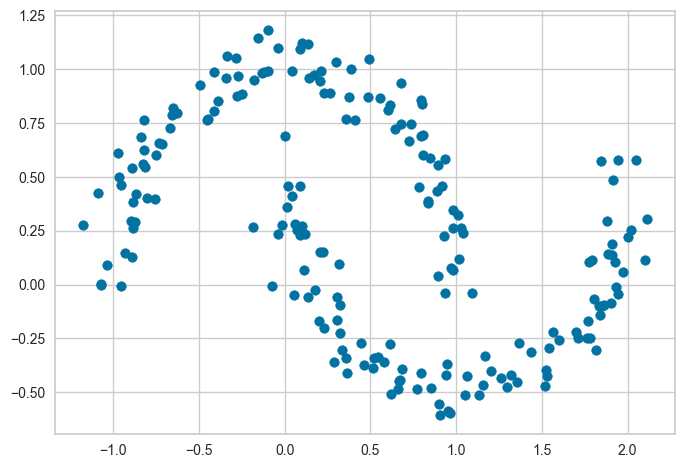

In [39]:
plt.scatter(X[:, 0], X[:, 1]);

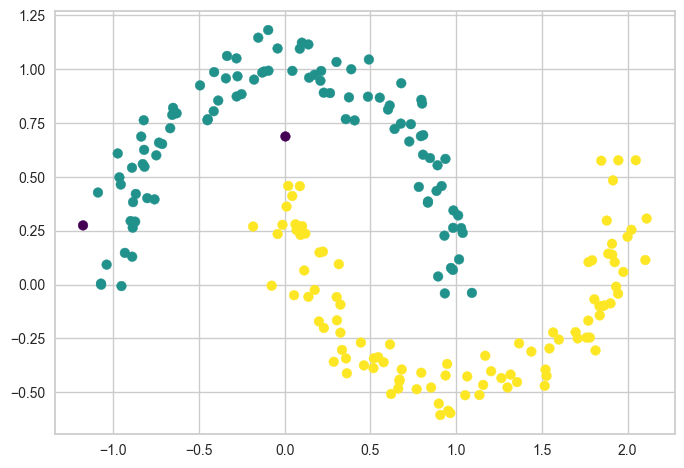

In [40]:
plt.scatter(X[:, 0], X[:, 1], c=dbscan.labels_, cmap='viridis');

But what's happening with these two data points?

In [41]:
dbscan.labels_

array([ 0,  0,  0,  1,  1,  1,  0,  1,  1,  0,  0,  1,  1,  0,  1,  1,  0,
        1,  0,  0,  1,  0,  1,  0,  0,  0,  0,  0,  1,  1,  0,  0,  0,  0,
        1,  1,  1,  1,  1,  0,  0,  1,  0,  0,  1,  1,  0,  0,  1,  0,  1,
        1,  0,  1,  1,  0,  1,  0,  1,  0,  1,  0,  0,  0,  0,  1,  0,  1,
        0,  1,  0,  1,  1,  0,  1,  1,  0,  1, -1,  1,  0,  0,  0,  1,  1,
        0,  1,  0,  1,  0,  0,  1,  1,  0,  0,  1,  1,  0,  0,  1,  0,  0,
        1,  1,  1,  1,  0,  0,  1,  1,  1,  0,  1,  1,  0,  1,  0,  0,  1,
        0,  0,  1,  1,  1,  0,  0,  1,  1,  0,  0,  1,  0,  0,  1,  0,  1,
        0,  1,  0,  1,  1,  1,  1,  0,  0,  0,  0,  1,  0,  0,  1,  1,  0,
        0,  0,  0,  1,  1,  0,  0,  1,  1,  1,  1,  0,  0,  1,  0,  1,  0,
        0,  0,  0,  0,  1,  1,  1,  0,  1,  1,  0,  0,  1,  1,  1,  1,  0,
        1,  0,  0,  1,  1,  0,  1,  0,  1,  0, -1,  1,  1])

These two negative values of `-1` respresent no cluster assignments to these data points. So they are not a part of any clusters

- DBSCAN is able to capture half moons shape
- We don't not have to specify the number of clusters.
    - That said, it has two other non-trivial hyperparameters to tune.
- There are two examples which have not been assigned any label (noise examples).

One more example of DBSCAN clusters capturing complex cluster shapes.

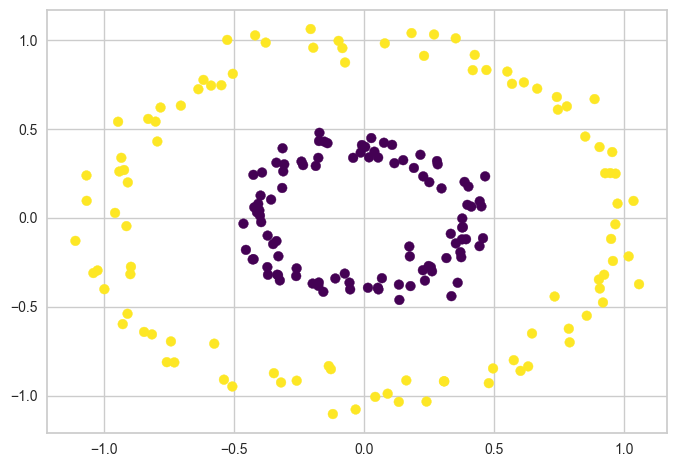

In [42]:
X = datasets.make_circles(n_samples=200, noise=0.06, factor=0.4)[0]
dbscan = DBSCAN(eps=0.3, min_samples=3)
dbscan.fit(X)
plt.scatter(X[:, 0], X[:, 1], c=dbscan.labels_, cmap='viridis');

There are no noise points here!

### How does it work?

- Iterative algorithm.  
- Based on the idea that clusters form dense regions in the data.

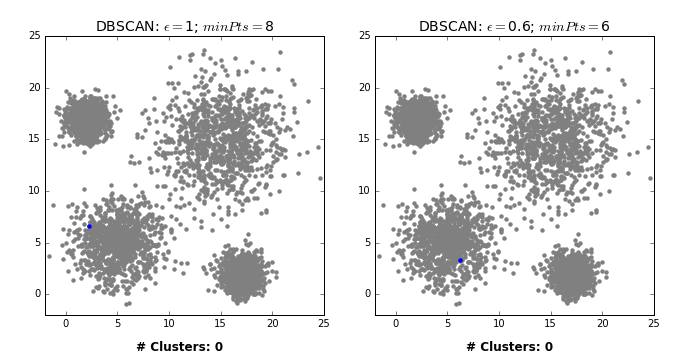

[Source](https://dashee87.github.io/data%20science/general/Clustering-with-Scikit-with-GIFs/)

### Two main hyperparameters
- `eps`: determines what it means for points to be "close"
- `min_samples`: determines the number of **neighboring points** we require to consider in order for a point to be part of a cluster

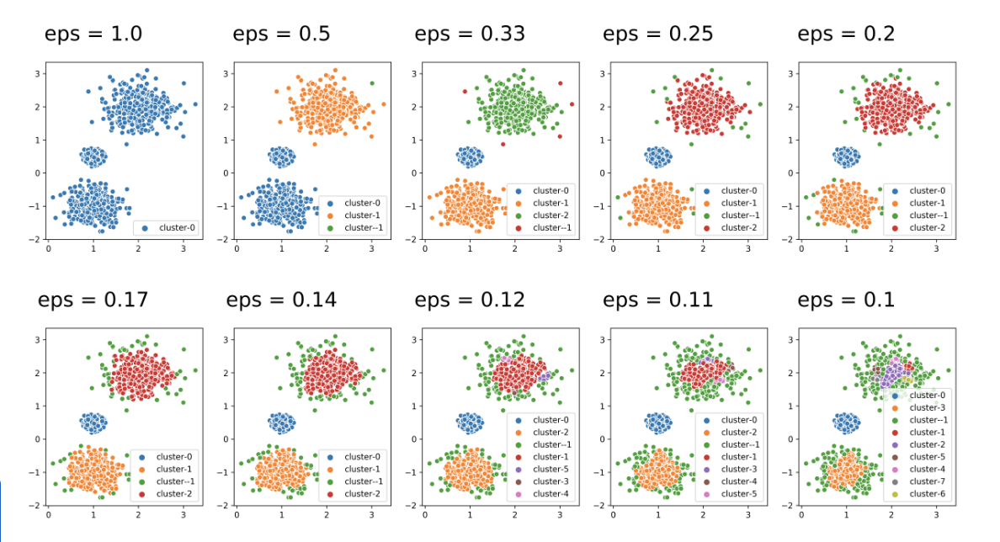

But it gets complicated when we have the effects of both `eps` and `min_samples` to consider at the same time

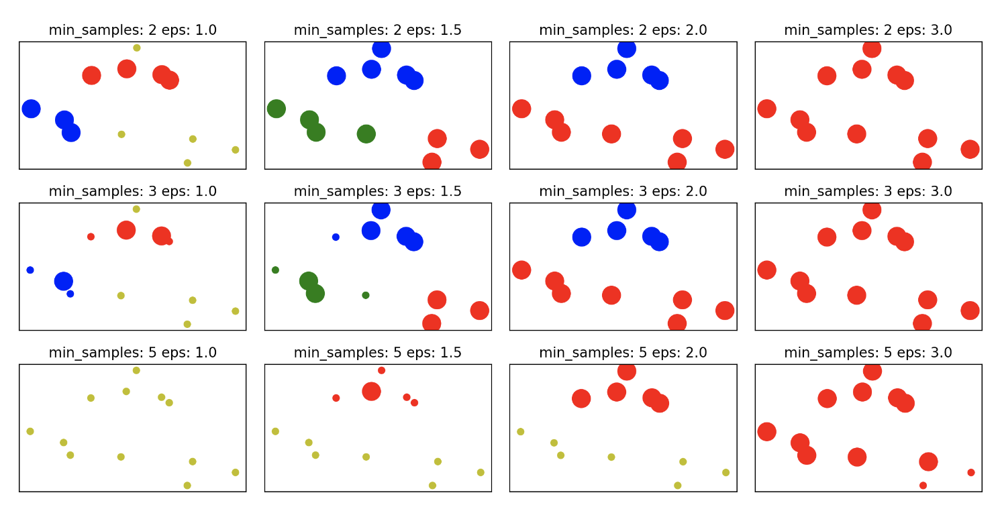

### More details on hyperparameters

There are three kinds of points.

- **Core points** are the points that have at least `min_samples` points within a distance of `eps`

- **Border points** are connected to a core point. They are within a distance of eps to core point but they have fewer than `min_samples` points within a distance of `eps`.

- **Noise points** are the points which do not belong to any cluster. In other words, the points which have less than `min_samples` points within distance `eps` of the starting point are noise points.

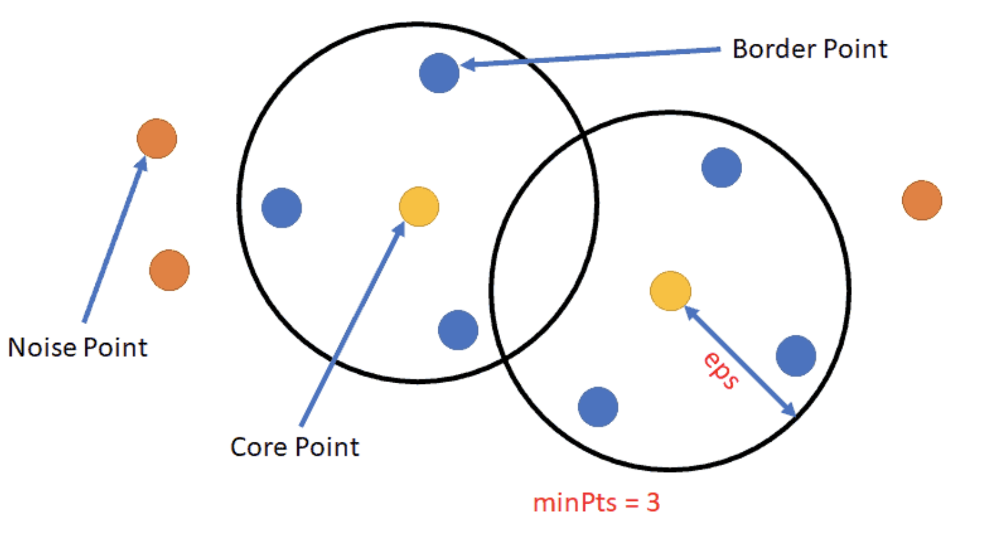

### DBSCAN algorithm

- Pick a point $p$ at random.
- Check whether $p$ is a "core" point or not. You can check this by looking at the number of neighbours within epsilon distance if they have at least `min_samples` points in the neighbourhood
- If $p$ is a core point, give it a colour (label).
- Spread the colour of $p$ to all of its neighbours.
- Check if any of the neighbours that received the colour is a core point, if yes, spread the colour to its neighbors as well.
- Once there are no more core points left to spread the colour, pick a new unlabeled point $p$ and repeat the process.

### K-Means vs. DBSCAN

- In DBSCAN, you do not have to specify the number of clusters!
    - Instead, you have to tune `eps` and `min_samples`.
- Unlike K-Means, DBSCAN doesn't have to assign all points to clusters.
    - The label is -1 if a point is unassigned.
- Unlike K-Means, there is no `predict` method.
    - DBSCAN only really clusters the points you have, not "new" or "test" points.

### Evaluating DBSCAN clusters
- We cannot use the elbow method to examine the goodness of clusters created with DBSCAN.
- But we can use the silhouette method because it's not dependent on the idea of cluster centers.

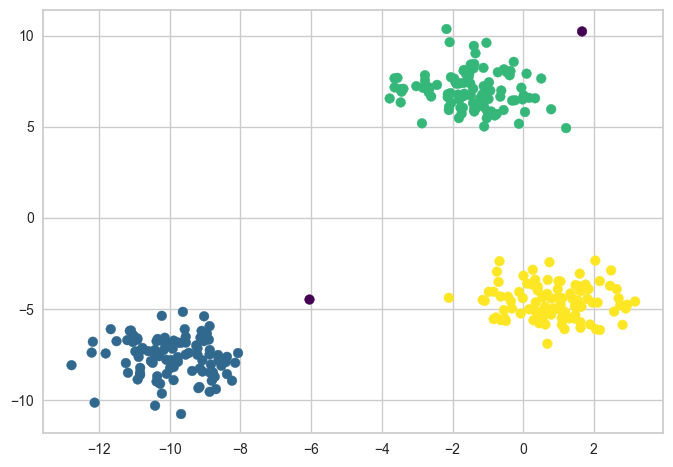

In [43]:
X, y = make_blobs(random_state=100, centers=3, n_samples=300)
dbscan = DBSCAN(eps=2, min_samples=5)
dbscan.fit(X)
plt.scatter(X[:,0], X[:,1], c=dbscan.labels_, cmap='viridis');

In [44]:
# Yellowbrick is designed to work with K-Means and not with DBSCAN.
# So it needs the number of clusters stored in n_clusters
# It also needs `predict` method to be implemented.
# So I'm implementing it here so that we can use Yellowbrick to show Silhouette plots.
n_clusters = len(set(dbscan.labels_))
dbscan.n_clusters = n_clusters
dbscan.predict = lambda x: dbscan.labels_

In [45]:
visualizer = SilhouetteVisualizer(dbscan, colors="yellowbrick")
visualizer.fit(X)  # Fit the data to the visualizer
visualizer.show();

YellowbrickTypeError: The supplied model is not a clustering estimator; try a classifier or regression score visualizer instead!

### DBSCAN: failure cases

- DBSCAN is able to capture complex clusters. But this doesn't mean that `DBSCAN` always works better. It has its own problems!
- DBSCAN doesn't do well when we have clusters with different densities.
    - You can play with the hyperparameters but it's not likely to help much.

### Summary: Pros and cons

- Pros
    - Can learn arbitrary cluster shapes
    - Can detect outliers
- Cons
    - Cannot `predict` on new examples.  
    - Needs tuning of two non-obvious hyperparameters

There is an improved version of DBSCAN called **hierarchical DBSCAN**

## Agglomerative Hierarchical Clustering

### Motivation

- Deciding how many clusters we want is a hard problem.
- Often, it's useful to get a complete picture of similarity between points in our data before picking the number of clusters.  
- Hierarchical clustering is helpful in these scenarios.  

### Main idea

1. Start with each point in its own cluster.
2. Greedily merge most similar *clusters*.
3. Repeat Step 2 until you obtain only one cluster ($n-1$ times).

### Visualizing hierarchical clustering

- Hierarchical clustering can be visualized using a tool called **a dendrogram**.
- Unfortunately, `sklearn` cannot do it so we will use the package `scipy.cluster.hierarchy` for hierarchical clustering.

### Hierarchical clustering input and output

In [46]:
from scipy.cluster.hierarchy import (
    average,
    complete,
    dendrogram,
    fcluster,
    single,
    ward,
)

X, y = make_blobs(random_state=0, n_samples=11)
linkage_array = ward(X)

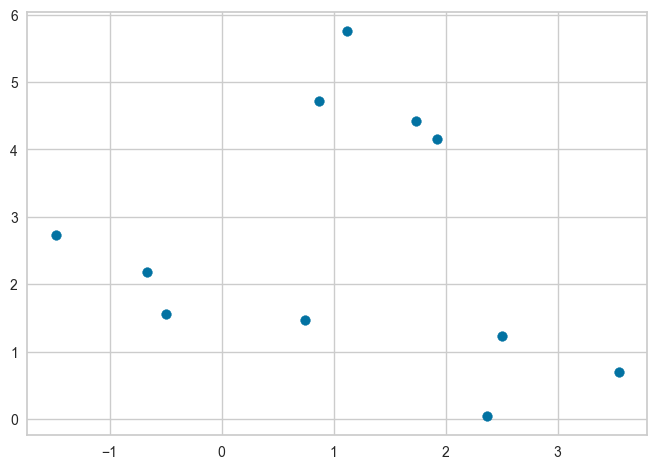

In [47]:
plt.scatter(X[:,0], X[:,1]);

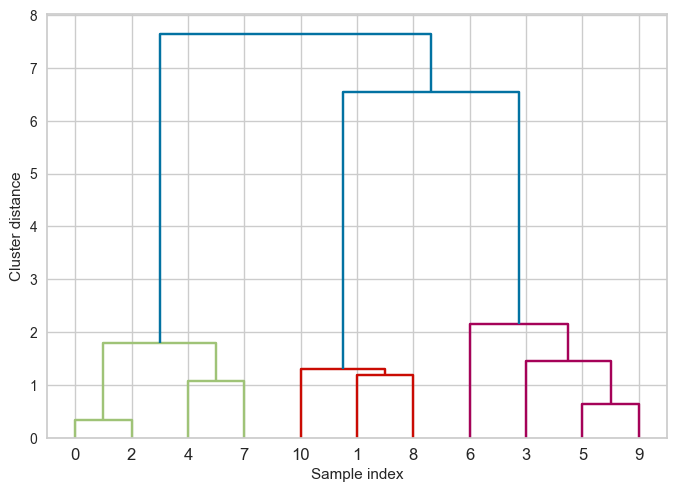

In [48]:
from scipy.cluster.hierarchy import dendrogram

ax = plt.gca()
dendrogram(linkage_array, ax=ax)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance");

- Every point goes through the journey of being on its own (its own cluster) and getting merged with some other bigger clusters.
- The intermediate steps in the process provide us clustering with different number of clusters.

### Dendrogram

- Dendrogram is a tree-like plot.
- On the x-axis we have data points.
- On the y-axis we have distances between clusters.
- We start with data points as leaves of the tree.  
- New parent node is created for every two clusters that are joined.
- The length of each branch shows how far the merged clusters go.
    - In the dendrogram above going from three clusters to two clusters means merging far apart points because the branches between three cluster to two clusters are long.

### Flat clusters

- This is good but how can we get cluster labels from a dendrogram?
- We can bring the clustering to a "flat" format use `fcluster`

Let's try flattening at a cluster distance of 3

In [49]:
from scipy.cluster.hierarchy import fcluster

# flattening the dendrogram based on maximum number of clusters.
hier_labels1 = fcluster(linkage_array, 3, criterion="maxclust")
hier_labels1

array([1, 2, 1, 3, 1, 3, 3, 1, 2, 3, 2], dtype=int32)

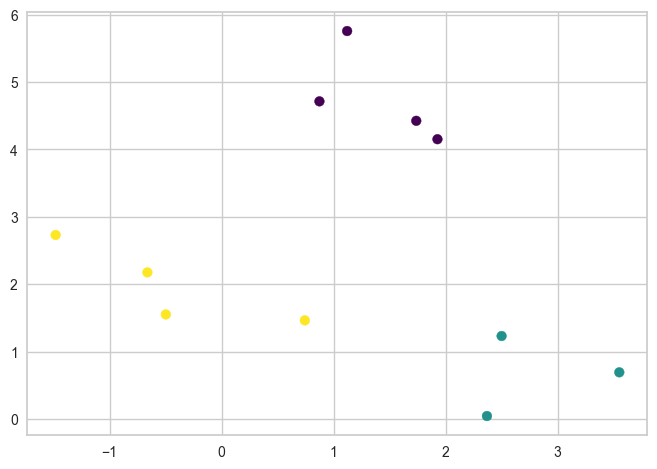

In [50]:
plt.scatter(X[:,0], X[:,1], c=hier_labels1, cmap='viridis');

Now let's try flattening at 1,5

In [51]:
# flattening the dendrogram based on maximum distance between points.
hier_labels2 = fcluster(linkage_array, 1.5, criterion="distance")
hier_labels2

array([1, 3, 1, 4, 2, 4, 5, 2, 3, 4, 3], dtype=int32)

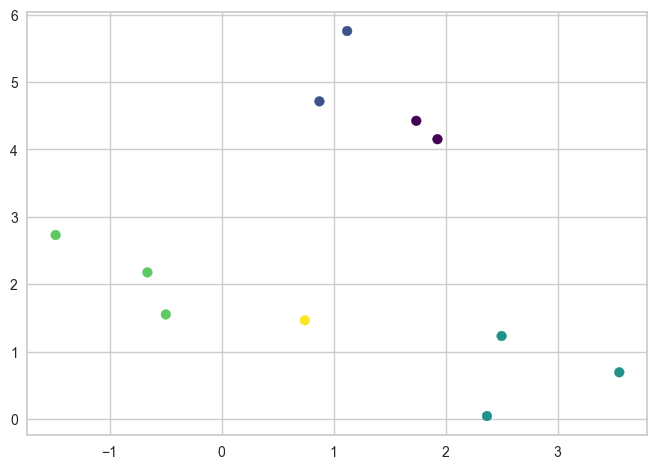

In [52]:
plt.scatter(X[:,0], X[:,1], c=hier_labels2, cmap='viridis');

When we create a dendrogram, we need to calculate distance between clusters.

- We know how to measure distance between points (e.g., using Euclidean distance).
- How do we measure distances between clusters?
- The **linkage criteria** determines how to find similarity between clusters:
- Some example linkage criteria are:
    - Single linkage $\rightarrow$ smallest minimal distance, leads to loose clusters
    - Complete linkage $\rightarrow$ smallest maximum distance, leads to tight clusters
    - Average linkage $\rightarrow$ smallest average distance between all pairs of points in the clusters
    - Ward linkage $\rightarrow$ smallest increase in within-cluster variance, leads to equally sized clusters

### `single` linkage

- Merges two clusters that have the smallest minimum distance between all their points.
- Let's use `scipy.cluster.hierarchy`'s `single` to get linkage information.
- This method gives us matrix `Z` with the merging information.

In [53]:
Z = single(X)
columns = ["c1", "c2", "distance(c1, c2)", "# observations"]
pd.DataFrame(Z, columns=columns).head()

,c1,c2,"distance(c1, c2)",# observations
0,0.0,2.0,0.332095,2.0
1,5.0,9.0,0.645802,2.0
2,7.0,11.0,0.911272,3.0
3,3.0,12.0,0.989059,3.0
4,4.0,13.0,1.072565,4.0


- The linkage returns a matrix `Z` of shape n-1 by 4:
- The rows represent iterations.
- First and second columns (c1 and c2 above): indexes of the clusters being merged.
- Third column (distance(c1, c2)): the distance between the clusters being merged.
- Fourth column (# observations): the number of examples in the newly formed cluster.

### Creating dendrogram with `single` linkage

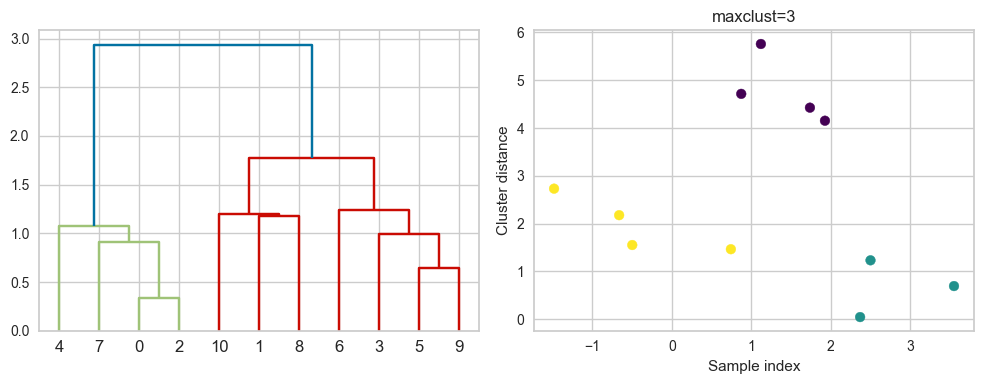

In [54]:
hier_labels = fcluster(Z, 3, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=3')

plt.tight_layout()

# Show the plots
plt.show()

Now suppose we decide to go from 3 clusters to 2 clusters. Which clusters would be merged with single linkage criterion? It will merge the clusters with the smallest minimal distance.

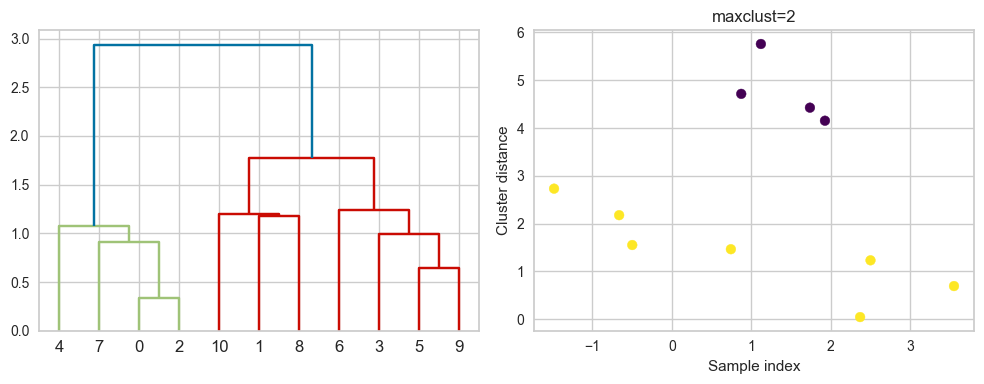

In [55]:
hier_labels = fcluster(Z, 2, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=2')

plt.tight_layout()

# Show the plots
plt.show()

### `complete` linkage

- Merges two clusters that have the smallest maximum distance between their points.

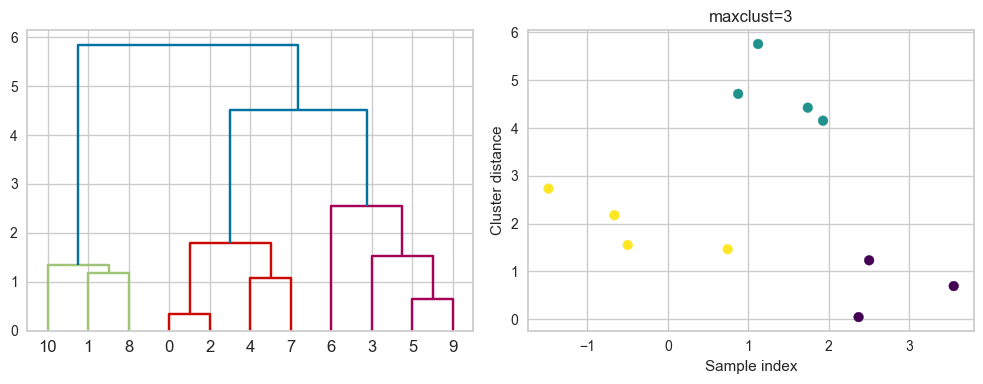

In [56]:
Z = complete(X)
hier_labels = fcluster(Z, 3, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=3')

plt.tight_layout()

# Show the plots
plt.show()

Suppose we decide to go from 3 clusters to 2 clusters. Which clusters would be merged with single linkage criterion? It will merge the clusters with the smallest maximum distance.

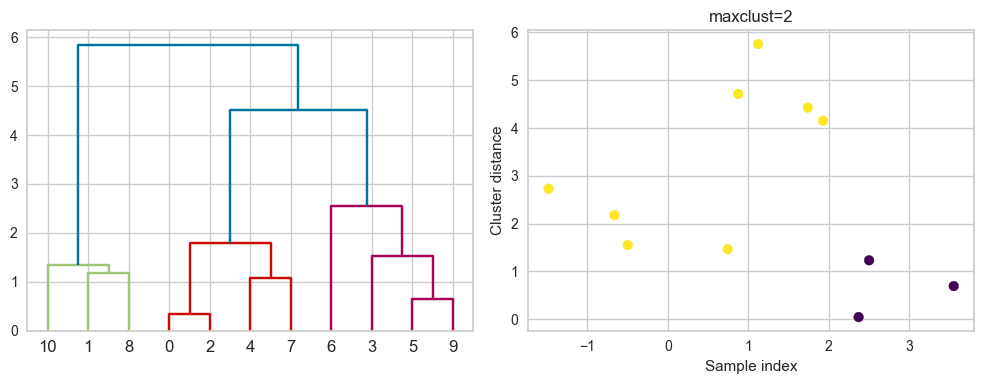

In [57]:
Z = complete(X)
hier_labels = fcluster(Z, 2, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=2')

plt.tight_layout()

# Show the plots
plt.show()

### `ward` linkage

- Picks two clusters to merge such that the variance within all clusters increases the least.
- Often leads to equally sized clusters.

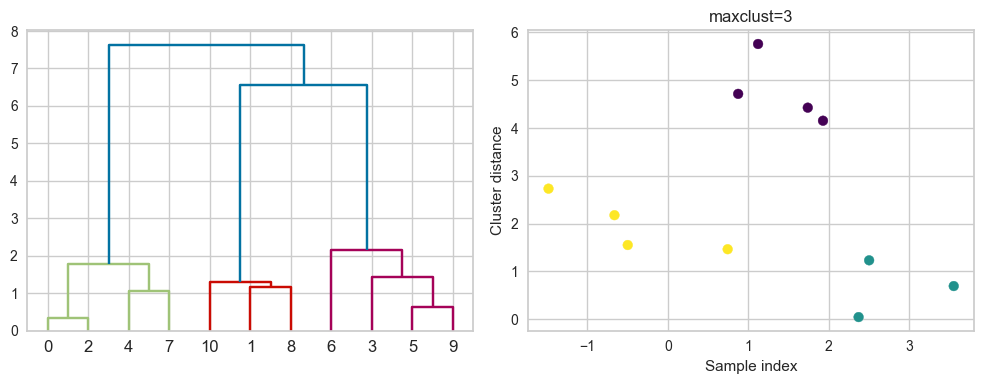

In [58]:
Z = ward(X)
hier_labels = fcluster(Z, 3, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=3')

plt.tight_layout()

# Show the plots
plt.show()

Suppose we decide to go from 3 clusters to 2 clusters. Which clusters would be merged with ward linkage criterion? It will merge the clusters with the smallest within-cluster variance.

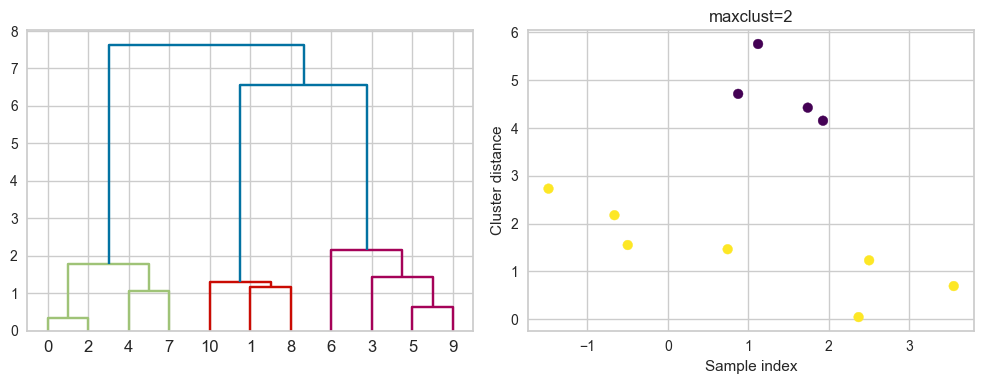

In [59]:
Z = ward(X)
hier_labels = fcluster(Z, 2, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=2')

plt.tight_layout()

# Show the plots
plt.show()

### `average` linkage

- Merges two clusters that have the smallest average distance between all their points.

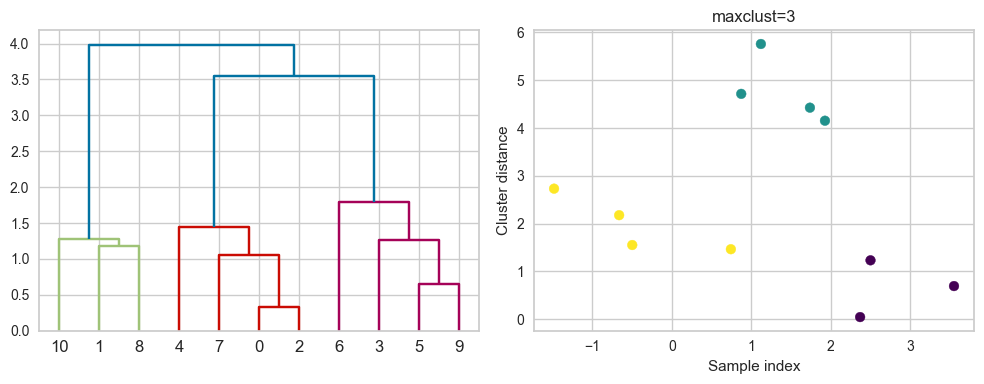

In [60]:
Z = average(X)
hier_labels = fcluster(Z, 3, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=3')

plt.tight_layout()

# Show the plots
plt.show()

Suppose we decide to go from 3 clusters to 2 clusters. Which clusters would be merged with single linkage criterion? It will merge the clusters with the smallest average distance.

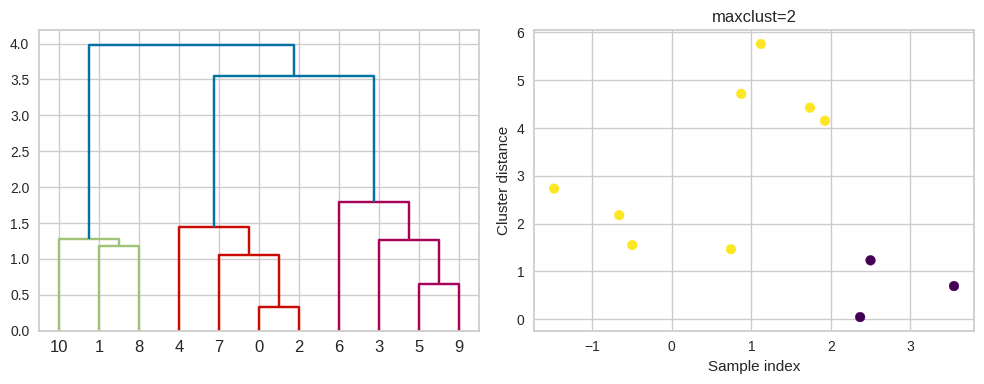

In [70]:
Z = average(X)
hier_labels = fcluster(Z, 2, criterion="maxclust")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

dendrogram(Z, ax=ax1)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.title('Single Linkage')

plt.scatter(X[:,0], X[:,1], c=hier_labels, cmap='viridis')
plt.title('maxclust=2')

plt.tight_layout()

# Show the plots
plt.show()

Different type of linkage criterion can be appropriate in different scenarios and the goals of clustering analysis. On a high level:
- Single linkage $\rightarrow$ smallest minimal distance, leads to loose clusters
- Complete linkage $\rightarrow$ smallest maximum distance, leads to tight clusters
- Average linkage $\rightarrow$ smallest average distance between all pairs of points in the clusters
- Ward linkage $\rightarrow$ smallest increase in within-cluster variance, leads to equally sized clusters

### Truncation

This is a toy dataset and it's possible to view all the leaves. But what if we have thousands of examples, which is common in real-world datasets? We can use truncation. There are two levels of truncation supported in `scipy.cluster.hierarchy`.
- `level` $\rightarrow$ Maximum depth of the tree is $p$
- `lastp` $\rightarrow$ Only $p$ leaves are shown

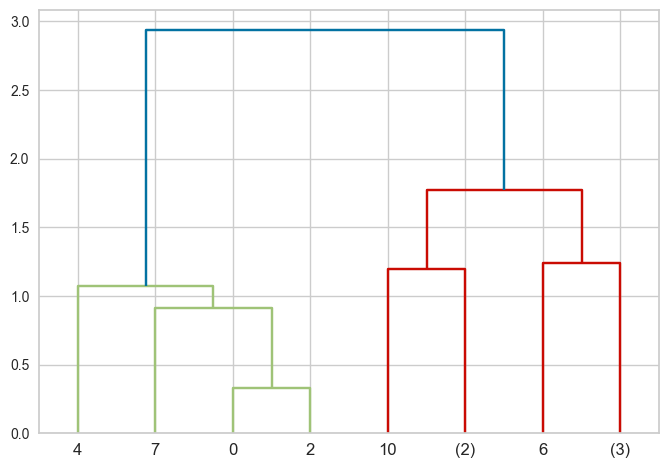

In [61]:
Z = single(X)
dendrogram(Z, p=2, truncate_mode="level");
# p is the max depth of the tree

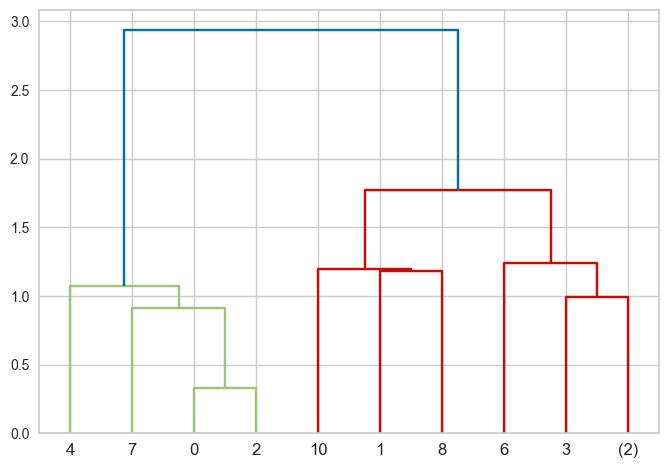

In [62]:
Z = single(X)
dendrogram(Z, p=3, truncate_mode="level");

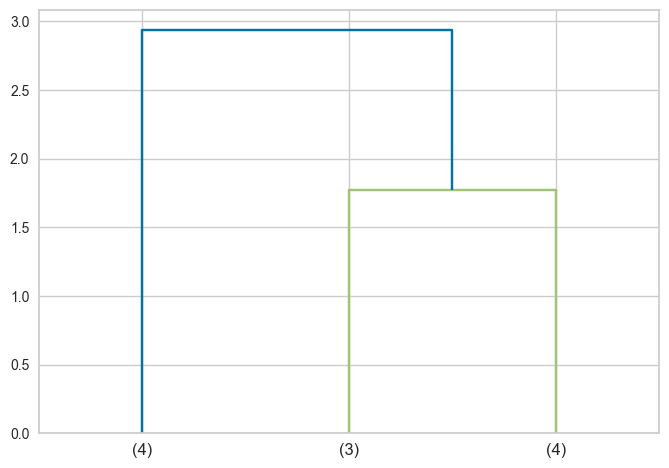

In [63]:
Z = single(X)
dendrogram(Z, p=3, truncate_mode="lastp");

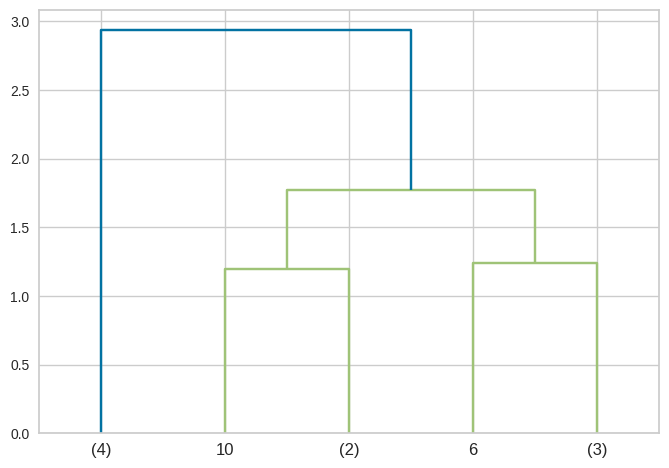

In [74]:
Z = single(X)
dendrogram(Z, p=5, truncate_mode="lastp");